# Segmentation of DFKV data

In this notebook, we use the finetuned Detectron2 model to segment the illustrations. 

To run this whole notebook, you just need 

- a folder containing all the images you want to predict on
- the weights of the trained model
- the detectron2 folders 

At the end, you will have :

- a json file containg all the bouding boxes for each illustration
- all the cropped illustrations found
- a csv file linking the documents ids and their illustrations ids

We start by installing the detectron2 package, in order to use it.

In [ ]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'#

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-5c0jjts4
  Running command git clone -q https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-5c0jjts4
     |████████████████████████████████| 50 kB 2.4 MB/s 
     |████████████████████████████████| 74 kB 2.5 MB/s 
     |████████████████████████████████| 145 kB 43.8 MB/s 
     |████████████████████████████████| 130 kB 37.7 MB/s 
     |████████████████████████████████| 38.1 MB 1.4 MB/s 
     |████████████████████████████████| 843 kB 43.4 MB/s 
     |████████████████████████████████| 749 kB 47.7 MB/s 
     |████████████████████████████████| 596 kB 50.4 MB/s 
     |████████████████████████████████| 112 kB 49.7 MB/s 
  Created wheel for detectron2: filename=detectron2-0.6-cp37-cp37m-linux_x86_64.whl size=5692844 sha256=48259b259da15c07a507b1f802eba9c12566d0ba9577e712c08aacd57b6a7d1a
  Stored in directory: /tmp/pip-ephem-wheel-cache-qwvi3kz6/wheels/07/dc/32/0322cb484dbefab8b9366bfedbaff5060ac7

In [ ]:
# Mounting Google Drive content
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [ ]:
# Go into the directory where your notebook is
%cd gdrive/My Drive/newspaper-navigator/newspaper-navigator/notebooks

/content/gdrive/My Drive/newspaper-navigator/newspaper-navigator/notebooks


In [ ]:
# to display images inline
%matplotlib inline

# import some common libraries
import cv2
import random
import glob
import os
import shutil
import json
import math
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
from tqdm import tqdm
import torch
import datetime
import gc
import time


# import detectron2, etc.
import detectron2
from detectron2.config import get_cfg
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.engine import DefaultPredictor
from detectron2.evaluation import COCOEvaluator
from detectron2.utils.visualizer import Visualizer
from detectron2.utils.visualizer import ColorMode
from detectron2.checkpoint import DetectionCheckpointer
from detectron2.utils.logger import setup_logger
from detectron2.modeling import build_model

from multiprocessing import Pool, get_context, Process, set_start_method

We now generate the predictions

In [ ]:
# function that splits a list into n chunks for multiprocessing
def chunk(file_list, n_chunks):
    # make chunks of files to be distributed across processes
    chunks = []
    chunk_size = math.ceil(float(len(file_list))/n_chunks)
    for i in range(0, n_chunks-1):
        chunks.append(file_list[i*chunk_size:(i+1)*chunk_size])
    chunks.append(file_list[(n_chunks-1)*chunk_size:])
    
    return chunks

In [ ]:
def generate_predictions(zipped):
    # unzips packed information for process to perform predictions
    
    S3_SAVE_DIR = zipped[0]
    OUTPUT_SAVE_DIR = zipped[1]
    dir_name = zipped[2]
    INFERENCE_BATCH_SIZE = zipped[3]
    filepaths = zipped[4]
    ID = zipped[5]
    
        

    # navigates to correct directory (process is spawned in /notebooks)

    os.chdir(S3_SAVE_DIR + dir_name)

    # sets up model for process

    setup_logger()
    cfg = get_cfg()
    cfg.merge_from_file("../../..//detectron2/configs/COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")

    # sets prediction score threshold - this is commented out and defaults to 0.05 in Detectron2
    # if you would like to adjust the threshold, uncomment and set to the desired value in [0, 1)
    cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.95

    # sets number of object classes to 1
    # ("Illustration")
    cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

        # build model
    model = build_model(cfg)

    # see:  https://github.com/facebookresearch/detectron2/issues/282 
    # (must load weights this way if using model)
    DetectionCheckpointer(model).load("../../model_weights/model_final_003.pth")
    model.train(False) 

    # construct batches
    batches = chunk(filepaths, math.ceil(len(filepaths)/INFERENCE_BATCH_SIZE))

    # iterate through images
    for batch in tqdm(batches):
        # sets up inputs by loading in all files in batch
        inputs = []

        # stores image dimensions
        dimensions = []

        # iterate through files in batch
        for file in batch:

            # read in image
            image = cv2.imread(file)

            # store image dimensions
            height, width, _ = image.shape
            if height > MAX_HEIGHT:
              
              height = int(width * MAX_HEIGHT/height)
              width = MAX_HEIGHT

              image = cv2.resize(image, (width, height), interpolation = cv2.INTER_AREA)

              dimensions.append([width, height])

              # perform inference on batch
              image = np.transpose(image,(2,0,1))
              # see https://github.com/facebookresearch/detectron2/issues/282 for in-depth description of why 
              # image is loaded in this way
              image_tensor = torch.from_numpy(image)
              inputs.append({"image": image_tensor})

              # performs inference
              outputs = model(inputs)

              # saves predictions
              predictions = {}

              # iterate over images in batch and save predictions to JSON
              for i in range(0, len(batch)):

                  # add metadata
                  predictions["doc_id"] = batch[i].split("_")[1]
                  predictions["page_number"] = batch[i].split("_")[2].replace(".jpg", "")
                      
                      
                  # saves predictions
                  # we first normalize the bounding box coordinates
                  boxes = outputs[i]["instances"].get_fields()["pred_boxes"].to("cpu").tensor.tolist()
                  normalized_boxes = []
                  width = dimensions[i][0]
                  height = dimensions[i][1]

                  for box in boxes:
                      normalized_box = (box[0]/float(width), box[1]/float(height), box[2]/float(width), box[3]/float(height))
                      normalized_boxes.append(normalized_box)

                  # saves additional outputs of predictions
                  predictions["boxes"] = normalized_boxes
                  predictions["scores"] = outputs[i]["instances"].get_fields()["scores"].to("cpu").tolist()
                  predictions["pred_classes"] = outputs[i]["instances"].get_fields()["pred_classes"].to("cpu").tolist()

                  with open(OUTPUT_SAVE_DIR + dir_name + batch[i].replace('.jpg','.json'), "w") as fp:
                      json.dump(predictions, fp)
                
            

In [ ]:
# sets number of GPUs available
N_GPUS = 1

# sets batch size for GPU inference; using 1 to prevent any memory overflow edge case in pipeline
INFERENCE_BATCH_SIZE = 1


# sets destination for saving downloaded S3 files
S3_SAVE_DIR = '../DFKV_data/'
# sets destination for output files, containing new metadata
OUTPUT_SAVE_DIR = '../../DFKV_output/'

dir_name = "DFKV/"

MAX_HEIGHT = 2000 # reduce it if cuda runs out of memory


# now we generate predictions on all of the downloaded files

print("predicting on pages...")
              
# FOR MULTIPROCESSING
os.chdir(S3_SAVE_DIR + dir_name)
chunked_image_filepaths = chunk(glob.glob("*.jpg"), N_GPUS)
os.chdir("../../notebooks/")


for i in range(0, N_GPUS):
    zipped = [S3_SAVE_DIR, OUTPUT_SAVE_DIR, dir_name, INFERENCE_BATCH_SIZE, chunked_image_filepaths[i], i]
    generate_predictions(zipped)

predicting on pages...


  0%|          | 56/12698 [00:01<05:56, 35.43it/s]/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
100%|██████████| 12698/12698 [1:49:04<00:00,  1.94it/s]


Now that all of our predictions are done, let's visualize some of them.

In [ ]:
all_images = glob.glob("*.jpg")

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.patches import Rectangle

SCORE_THRESHOLD = 0.99

def show_image_preds(img_to_show):
    os.chdir(S3_SAVE_DIR + dir_name)
    plt.figure(figsize=(18, 18))
    img = mpimg.imread(img_to_show + '.jpg')
    print(img_to_show)
    im_h, im_w = img.shape[0], img.shape[1]

    imgplot = plt.imshow(img)

    os.chdir(OUTPUT_SAVE_DIR + dir_name)
    f = open(img_to_show + '.json')
    data = json.load(f)


    # Get the current reference
    ax = plt.gca()

    for box, score in zip(data['boxes'],  data['scores']):
        if score > SCORE_THRESHOLD :

            # Create a Rectangle patch
            x = im_w*box[0]  
            y = im_h*box[1]  
            w = im_w*box[2]  - x
            h = im_h*box[3]  - y

            rect = Rectangle((x,y),w,h,linewidth=1,edgecolor='r',facecolor='none') #(x,y), width, height

            # Add the patch to the Axes
            ax.add_patch(rect)

    plt.show()

DFKV_12674_462


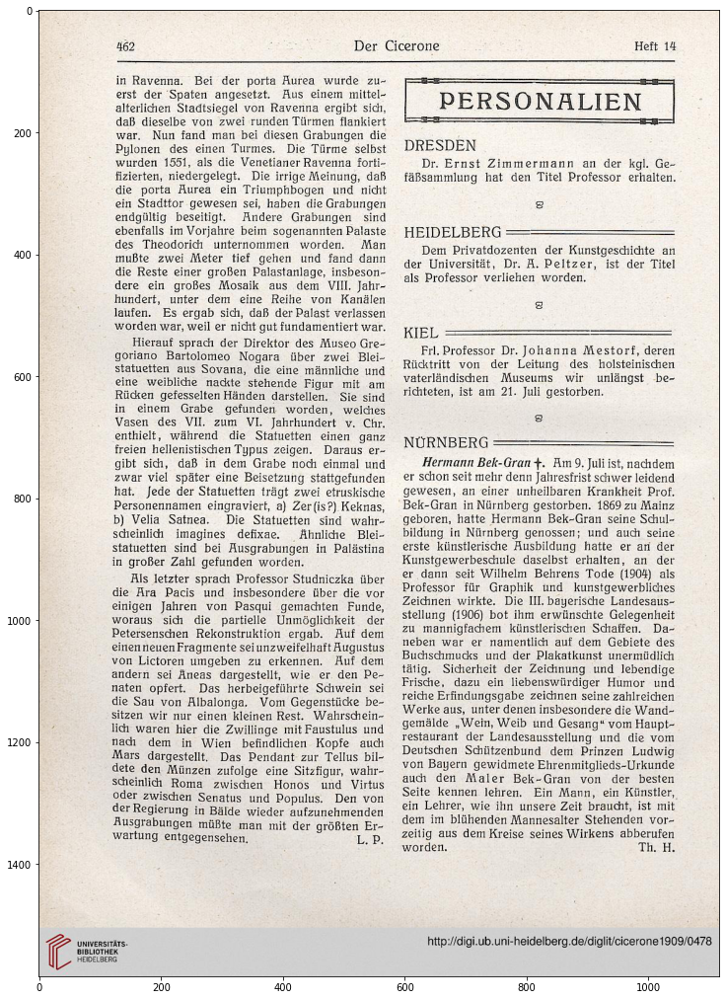

DFKV_11524_153


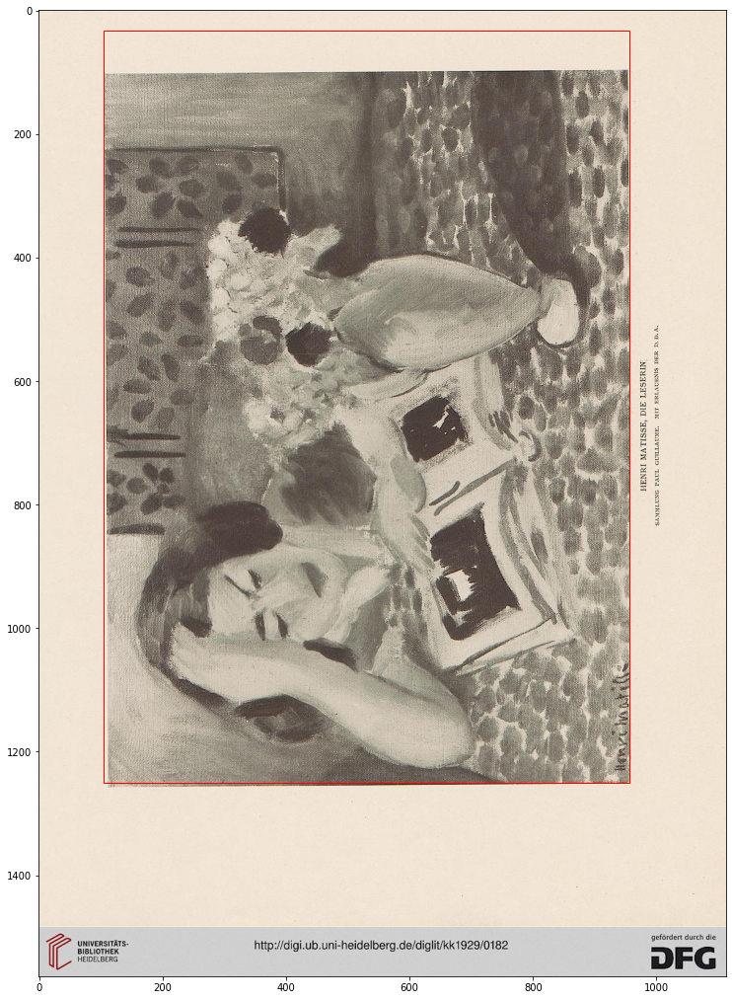

DFKV_10466_526


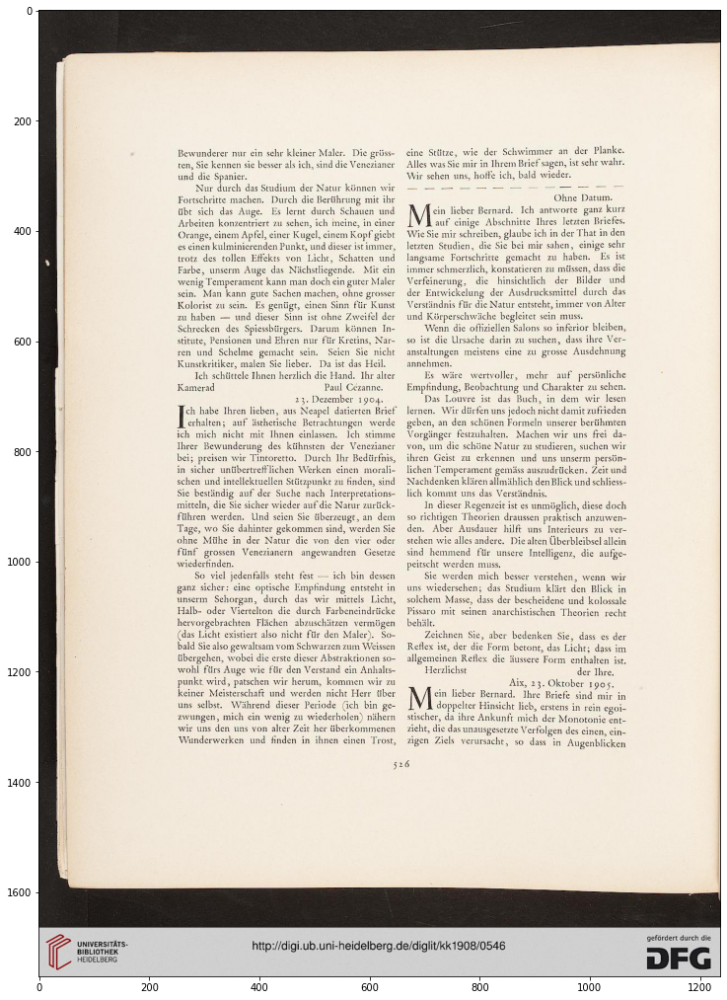

DFKV_15325_54


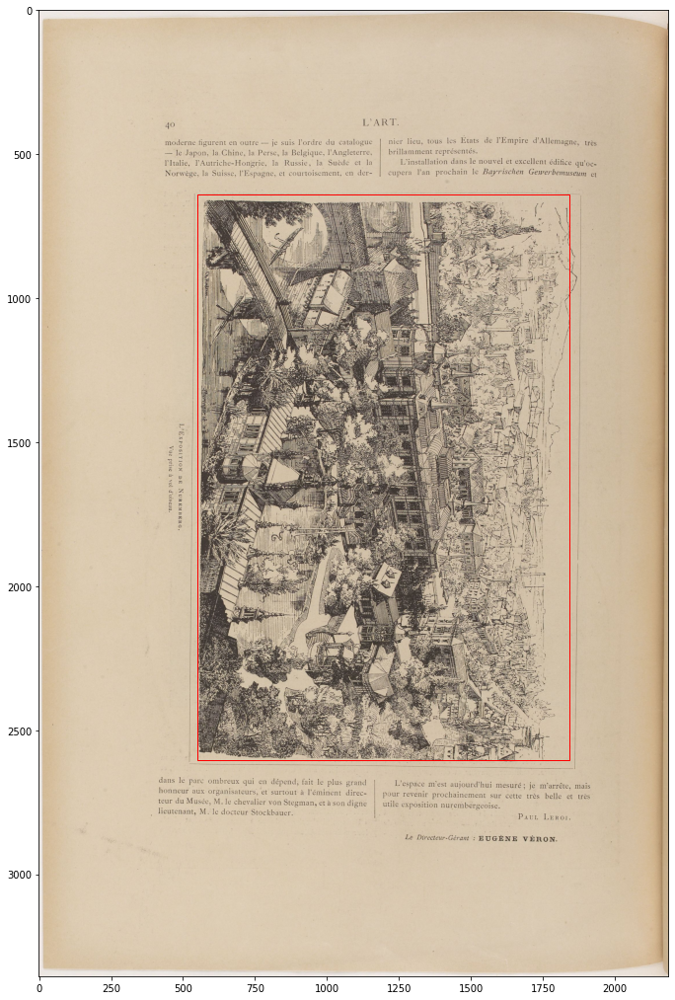

DFKV_11441_623


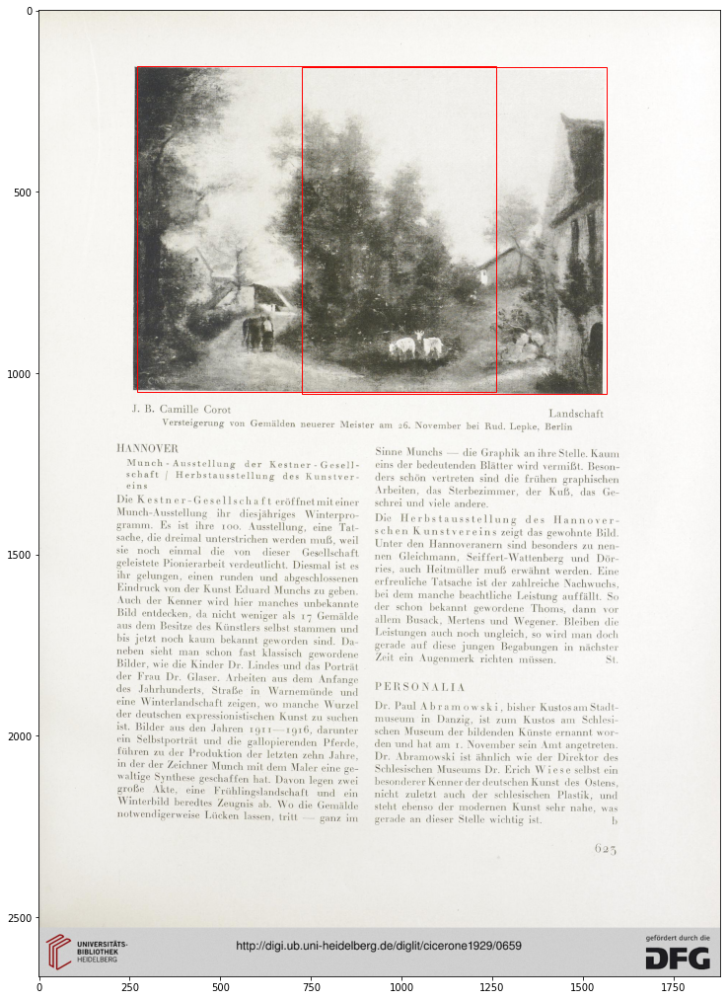

DFKV_15291_371


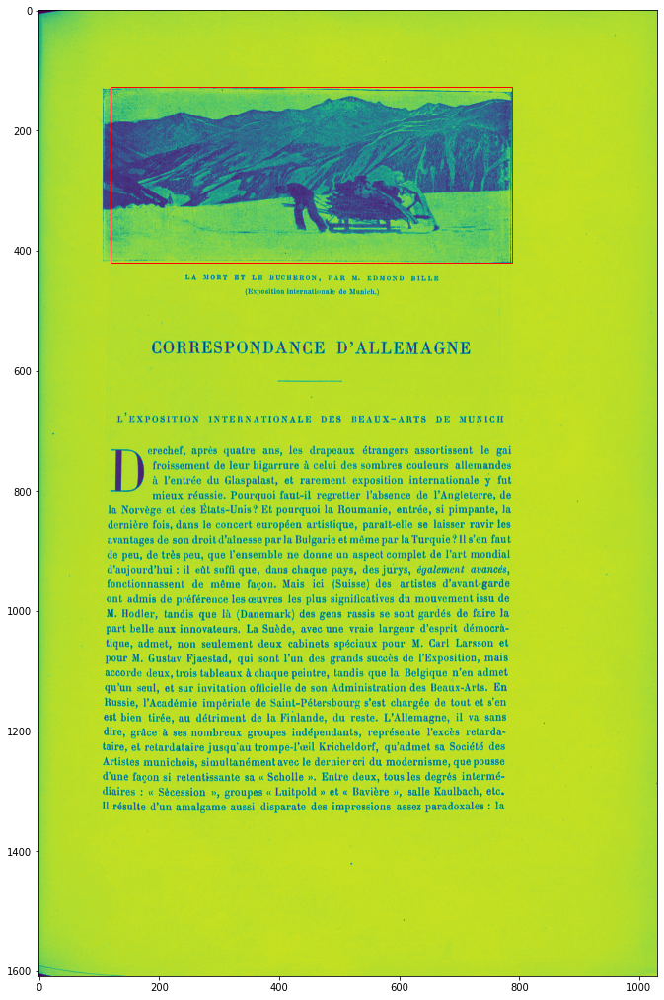

DFKV_15327_92


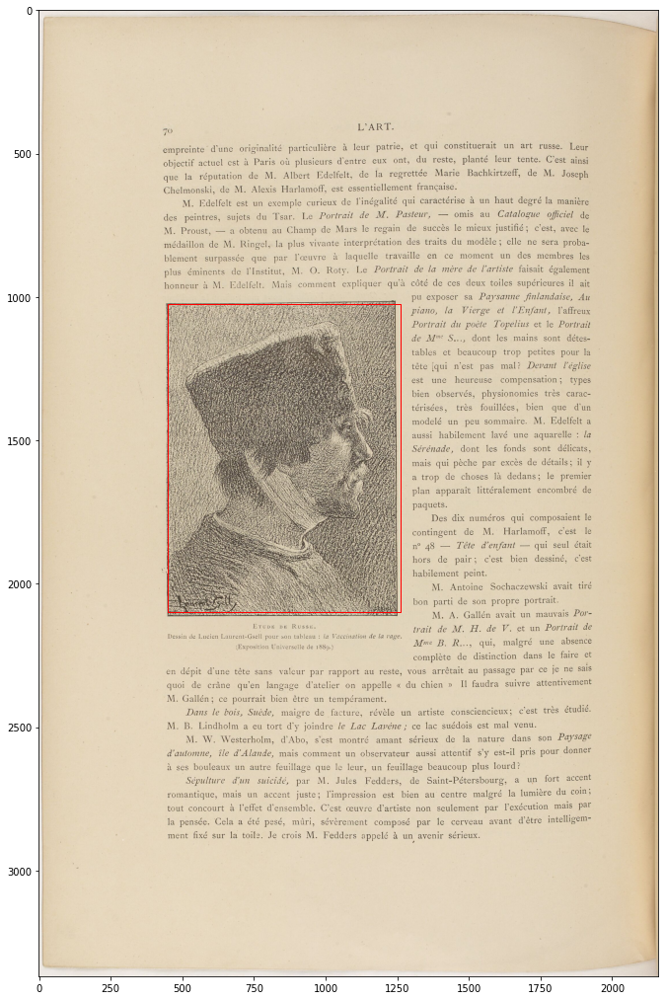

DFKV_10555_184


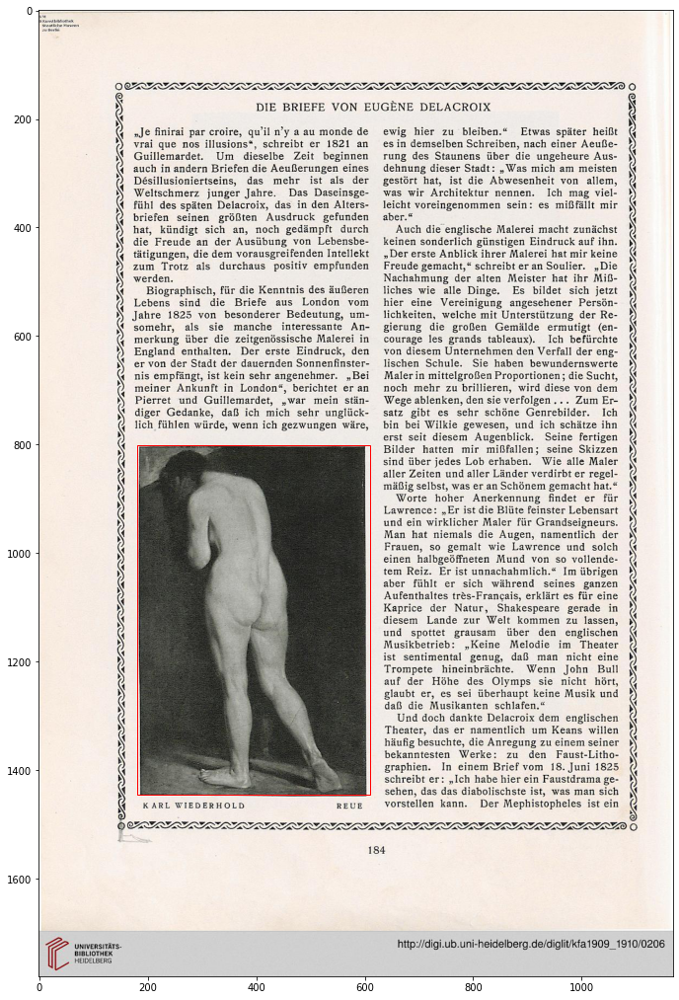

In [ ]:
show_image_preds(random.sample(all_images, 1)[0].replace('.jpg', ''))